In [3]:
import numpy as np
import pandas as pd
import plotly.express as px
import math
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

In [4]:
#Loading the dataset
df_lap_train=pd.read_csv('/Users/alesarabandi/Loan-Appr-Pred/train.csv')
df_lap_test=pd.read_csv('/Users/alesarabandi/Loan-Appr-Pred/test.csv')

## Exploratory Data Analysis

In [5]:
#Visualize the dataset
df_lap_train.head(10)

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0
5,5,27,45000,RENT,2.0,VENTURE,A,9000,8.94,0.20,N,5,0
6,6,25,45000,MORTGAGE,9.0,EDUCATION,A,12000,6.54,0.27,N,3,0
7,7,21,20000,RENT,0.0,PERSONAL,C,2500,13.49,0.13,Y,3,0
8,8,37,69600,RENT,11.0,EDUCATION,D,5000,14.84,0.07,Y,11,0
9,9,35,110000,MORTGAGE,0.0,DEBTCONSOLIDATION,C,15000,12.98,0.14,Y,6,0


In [6]:
df_lap_train.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


In [7]:
df_lap_test.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
count,39098.000000,39098.000000,3.909800e+04,39098.000000,39098.000000,39098.000000,39098.000000,39098.000000
mean,78193.500000,27.566781,6.406046e+04,4.687068,9251.466188,10.661216,0.159573,5.830707
std,11286.764749,6.032761,3.795583e+04,3.868395,5576.254680,3.020220,0.091633,4.072157
min,58645.000000,20.000000,4.000000e+03,0.000000,700.000000,5.420000,0.000000,2.000000
25%,68419.250000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000
50%,78193.500000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000
75%,87967.750000,30.000000,7.588500e+04,7.000000,12000.000000,12.990000,0.210000,8.000000
max,97742.000000,94.000000,1.900000e+06,42.000000,35000.000000,22.110000,0.730000,30.000000


In [8]:
df_lap_train=df_lap_train.drop(['id'], axis = 1) 

In [9]:
df_lap_train.head(10)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0
5,27,45000,RENT,2.0,VENTURE,A,9000,8.94,0.20,N,5,0
6,25,45000,MORTGAGE,9.0,EDUCATION,A,12000,6.54,0.27,N,3,0
7,21,20000,RENT,0.0,PERSONAL,C,2500,13.49,0.13,Y,3,0
8,37,69600,RENT,11.0,EDUCATION,D,5000,14.84,0.07,Y,11,0
9,35,110000,MORTGAGE,0.0,DEBTCONSOLIDATION,C,15000,12.98,0.14,Y,6,0


In [10]:
#Information about columns and datatype
df_lap_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  58645 non-null  int64  
 1   person_income               58645 non-null  int64  
 2   person_home_ownership       58645 non-null  object 
 3   person_emp_length           58645 non-null  float64
 4   loan_intent                 58645 non-null  object 
 5   loan_grade                  58645 non-null  object 
 6   loan_amnt                   58645 non-null  int64  
 7   loan_int_rate               58645 non-null  float64
 8   loan_percent_income         58645 non-null  float64
 9   cb_person_default_on_file   58645 non-null  object 
 10  cb_person_cred_hist_length  58645 non-null  int64  
 11  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 5.4+ MB


## Categorical

### 1. Person Age

In [11]:
#Checking unique values of Attrition_flag
df_lap_train['person_age'].nunique()

53

<Axes: title={'center': 'Distribution of Person Age'}, xlabel='person_age'>

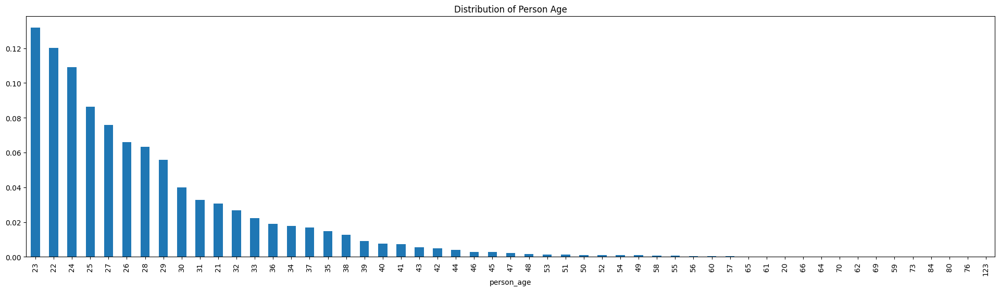

In [12]:
df_lap_train['person_age'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Person Age')

In [13]:
# Binning
df_lap_train.loc[df_lap_train['person_age']<=30, 'person_age_group'] = 'Below_30'
df_lap_train.loc[df_lap_train['person_age'].between(31,40), 'person_age_group'] = '31_40'
df_lap_train.loc[df_lap_train['person_age'].between(41,50), 'person_age_group'] = '41_50'
df_lap_train.loc[df_lap_train['person_age'].between(51,60), 'person_age_group'] = '51_60'
df_lap_train.loc[df_lap_train['person_age']>=61, 'person_age_group'] = 'Above_60'

<Axes: title={'center': 'Distribution of Person Age Groups'}, xlabel='person_age_group'>

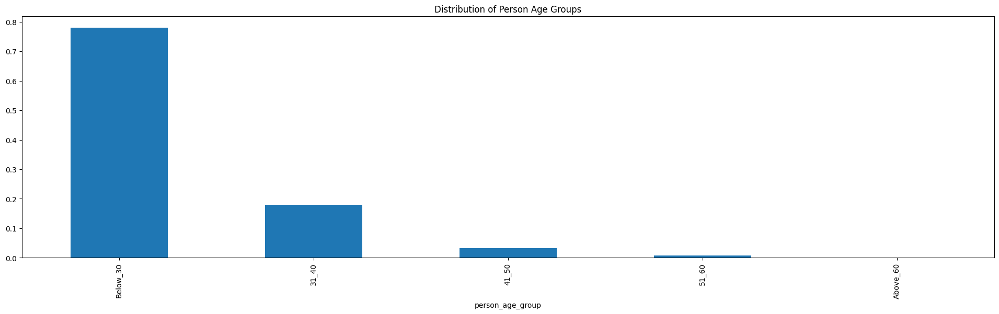

In [14]:
df_lap_train['person_age_group'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Person Age Groups')

In [15]:
df_xy=df_lap_train.groupby(['person_age_group','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)
import plotly.express as px

fig = px.histogram(df_xy, x="person_age_group",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="Age Wise Loan Approval Rates")
fig.show()

### 2. person_home_ownership       

<Axes: title={'center': 'Distribution of Home Ownership'}, xlabel='person_home_ownership'>

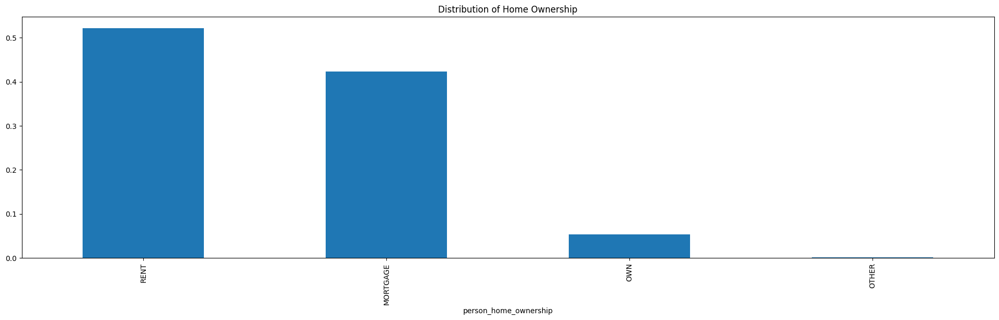

In [16]:
df_lap_train['person_home_ownership'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Home Ownership')

In [17]:
df_xy=df_lap_train.groupby(['person_home_ownership','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)
import plotly.express as px

fig = px.histogram(df_xy, x="person_home_ownership",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="Home Ownership Wise Loan Approval Rates")
fig.show()

### 3 Employmnt Length

In [18]:
df_lap_train['person_emp_length'].nunique()

36

<Axes: title={'center': 'Distribution of Employment Length'}, xlabel='person_emp_length'>

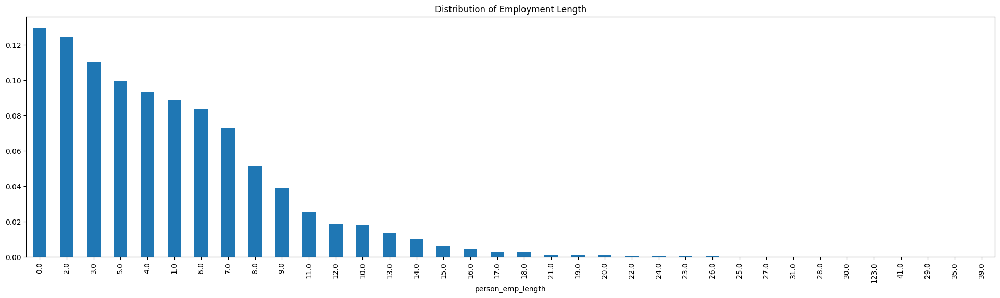

In [19]:
df_lap_train['person_emp_length'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Employment Length')

In [20]:
# Binning
df_lap_train.loc[df_lap_train['person_emp_length']==0, 'person_emp_length_group'] = 'Not_Employed'
df_lap_train.loc[df_lap_train['person_emp_length'].between(1,5), 'person_emp_length_group'] = '1_5'
df_lap_train.loc[df_lap_train['person_emp_length'].between(6,10), 'person_emp_length_group'] = '6_10'
df_lap_train.loc[df_lap_train['person_emp_length'].between(11,15), 'person_emp_length_group'] = '11_15'
df_lap_train.loc[df_lap_train['person_emp_length'].between(16,20), 'person_emp_length_group'] = '16_20'
df_lap_train.loc[df_lap_train['person_emp_length']>20, 'person_emp_length_group'] = 'Above_20'

<Axes: title={'center': 'Distribution of Employment Length'}, xlabel='person_emp_length_group'>

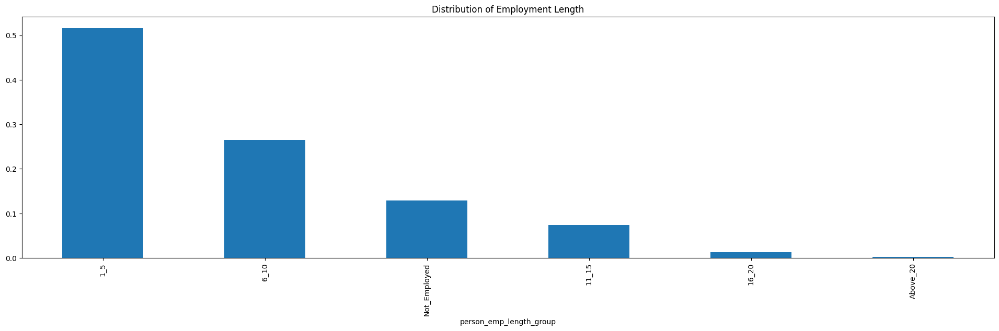

In [21]:
df_lap_train['person_emp_length_group'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Employment Length')

In [22]:
df_xy=df_lap_train.groupby(['person_emp_length_group','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)
import plotly.express as px

fig = px.histogram(df_xy, x="person_emp_length_group",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="Employment Wise Loan Approval Rates")
fig.show()

### 4. Loan Intent

<Axes: title={'center': 'Distribution of Loan Intent'}, xlabel='loan_intent'>

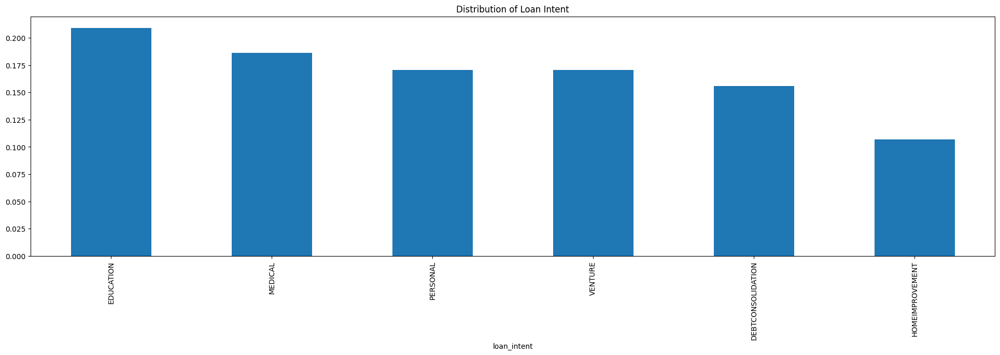

In [23]:
df_lap_train['loan_intent'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Loan Intent')

In [24]:
df_xy=df_lap_train.groupby(['loan_intent','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)
import plotly.express as px

fig = px.histogram(df_xy, x="loan_intent",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="Loan Intent Wise Loan Approval Rates")
fig.show()

### 5. Loan Grade

<Axes: title={'center': 'Distribution of Loan Intent'}, xlabel='loan_grade'>

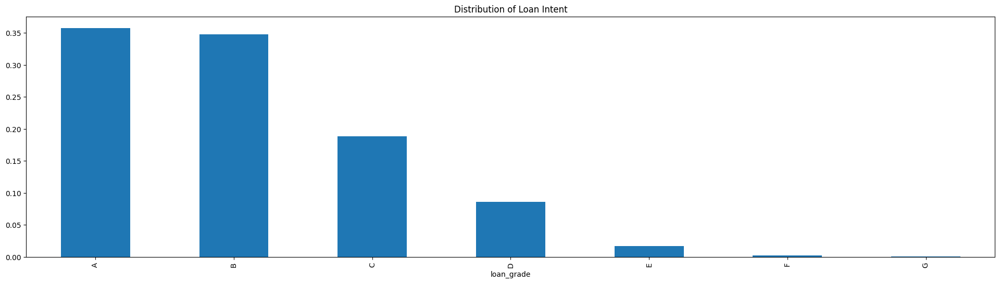

In [25]:
df_lap_train['loan_grade'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of Loan Intent')

In [26]:
df_xy=df_lap_train.groupby(['loan_grade','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)
import plotly.express as px

fig = px.histogram(df_xy, x="loan_grade",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="Loan Grade Wise Loan Approval Rates")
fig.show()

### 6. Distribution of CB Default

<Axes: title={'center': 'Distribution of CB Default'}, xlabel='cb_person_default_on_file'>

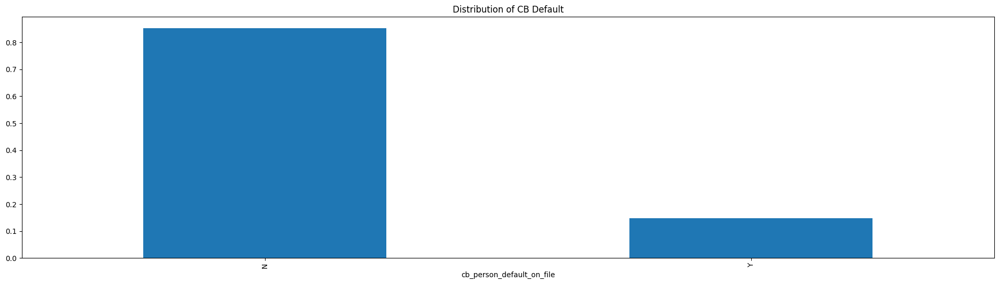

In [27]:
df_lap_train['cb_person_default_on_file'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of CB Default')

In [28]:
#Creating Temp dataframe with Group By Count
df_xy=df_lap_train.groupby(['cb_person_default_on_file','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)

#Using Plotly to create Visualization
fig = px.histogram(df_xy, x="cb_person_default_on_file",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="CB Default Wise Loan Approval Rates")
fig.show()

### cb_person_cred_hist_length   

<Axes: title={'center': 'Distribution of CB History'}, xlabel='cb_person_cred_hist_length'>

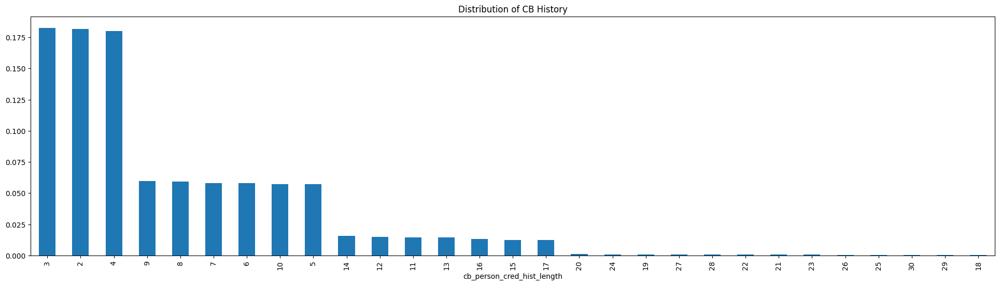

In [29]:
 df_lap_train['cb_person_cred_hist_length'].value_counts(normalize=True).plot.bar(figsize=(24,6), title='Distribution of CB History')

In [30]:
#Creating Temp dataframe with Group By Count
df_xy=df_lap_train.groupby(['cb_person_cred_hist_length','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)

#Using Plotly to create Visualization
fig = px.histogram(df_xy, x="cb_person_cred_hist_length",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="CB History Loan Approval Rates")
fig.show()

In [31]:
# Binning
df_lap_train.loc[df_lap_train['cb_person_cred_hist_length']==0, 'cb_person_cred_hist_length_group'] = 'No_History'
df_lap_train.loc[df_lap_train['cb_person_cred_hist_length'].between(1,5), 'cb_person_cred_hist_length_group'] = '1_5'
df_lap_train.loc[df_lap_train['cb_person_cred_hist_length'].between(6,10), 'cb_person_cred_hist_length_group'] = '6_10'
df_lap_train.loc[df_lap_train['cb_person_cred_hist_length'].between(11,15), 'cb_person_cred_hist_length_group'] = '11_15'
df_lap_train.loc[df_lap_train['cb_person_cred_hist_length'].between(16,20), 'cb_person_cred_hist_length_group'] = '16_20'
df_lap_train.loc[df_lap_train['cb_person_cred_hist_length']>20, 'cb_person_cred_hist_length_group'] = 'Above_20'

In [32]:
#Creating Temp dataframe with Group By Count
df_xy=df_lap_train.groupby(['cb_person_cred_hist_length_group','loan_status']).size().reset_index(name='counts').sort_values(['counts'], ascending=False)

#Using Plotly to create Visualization
fig = px.histogram(df_xy, x="cb_person_cred_hist_length_group",
                   y="counts", color="loan_status",
                   barnorm='percent', text_auto='.2f',
                   title="CB Cred History Loan Approval Rates")
fig.show()

## Numberical Columns

### 1. Person Income

In [33]:
#Checking Person Income
print("Min:",df_lap_train['person_income'].min())
print("Max:",df_lap_train['person_income'].max())
print("Median:",df_lap_train['person_income'].median())
print("Mean:",df_lap_train['person_income'].mean())
print("Std:",df_lap_train['person_income'].std())
print("Count:",df_lap_train['person_income'].count())

Min: 4200
Max: 1900000
Median: 58000.0
Mean: 64046.17287066246
Std: 37931.10697849952
Count: 58645


In [34]:
fig = px.histogram(df_lap_train, x="person_income", color="loan_status", marginal="rug")
fig.show()

In [35]:
fig = px.box(df_lap_train, y="person_income")
fig.show()

Box plot Upper Fence is 126K whereas dataset has many outlier events.

Here we will clip all such values to Upper Fence of the Box plot.

Upper fence = Q3 + (1.5 * IQR) Lower fence = Q1 — (1.5 * IQR)

In [36]:
data=df_lap_train['person_income'].to_list()
## Calculate quartiles as outlined in the plotly documentation

def get_percentile(data, p):
    data.sort()
    n = len(data)
    x = n*p + 0.5

    #  If integer, return
    if x.is_integer():
        return round(data[int(x-1)], 2) # account for zero-indexing

    #  If not an integer, get the interpolated value of the values of floor and ceiling indices
    x1, x2 = math.floor(x), math.ceil(x)
    y1, y2 = data[x1-1], data[x2-1] # account for zero-indexing
    return round(np.interp(x=x, xp=[x1, x2], fp=[y1, y2]), 2)

## calculate all boxplot statistics
q1, median, q3 = get_percentile(data, 0.25), get_percentile(data, 0.50), get_percentile(data, 0.75)
iqr = q3 - q1
# Lower fence value is the minimum of y values that is more than the calculated lower limit
lower_limit = q1 - 1.5 * iqr
lower_fence = round(min([i for i in data if i >= lower_limit]), 2)
# Upper fence value is the maximum of y values that is less than the calculated upper limit
upper_limit = q3 + 1.5 * iqr
upper_fence = round(max([i for i in data if i <= upper_limit]), 2)
print('Upper Fence:',upper_fence,',Lower Fence:', lower_fence)

Upper Fence: 126000 ,Lower Fence: 4200


In [37]:
df_lap_train['person_income_updated']=df_lap_train.apply(lambda row: upper_fence if row['person_income'] > upper_fence else row['person_income'], axis=1)

In [38]:
fig = px.box(df_lap_train, y="person_income_updated")
fig.show()

In [39]:
#Checking Person Income
print("Min:",df_lap_train['person_income_updated'].min())
print("Max:",df_lap_train['person_income_updated'].max())
print("Median:",df_lap_train['person_income_updated'].median())
print("Count:",df_lap_train['person_income_updated'].count())

Min: 4200
Max: 126000
Median: 58000.0
Count: 58645


#### Loan Amount

In [40]:
#Checking Loan Amount
print("Min:",df_lap_train['loan_amnt'].min())
print("Max:",df_lap_train['loan_amnt'].max())
print("Median:",df_lap_train['loan_amnt'].median())
print("Mean:",df_lap_train['loan_amnt'].mean())
print("Std:",df_lap_train['loan_amnt'].std())
print("Count:",df_lap_train['loan_amnt'].count())

Min: 500
Max: 35000
Median: 8000.0
Mean: 9217.556518032228
Std: 5563.807384163699
Count: 58645


In [41]:
fig = px.box(df_lap_train, y="loan_amnt")
fig.show()

In [42]:
data=df_lap_train['loan_amnt'].to_list()
## Calculate quartiles as outlined in the plotly documentation

def get_percentile(data, p):
    data.sort()
    n = len(data)
    x = n*p + 0.5

    #  If integer, return
    if x.is_integer():
        return round(data[int(x-1)], 2) # account for zero-indexing

    #  If not an integer, get the interpolated value of the values of floor and ceiling indices
    x1, x2 = math.floor(x), math.ceil(x)
    y1, y2 = data[x1-1], data[x2-1] # account for zero-indexing
    return round(np.interp(x=x, xp=[x1, x2], fp=[y1, y2]), 2)

## calculate all boxplot statistics
q1, median, q3 = get_percentile(data, 0.25), get_percentile(data, 0.50), get_percentile(data, 0.75)
iqr = q3 - q1
# Lower fence value is the minimum of y values that is more than the calculated lower limit
lower_limit = q1 - 1.5 * iqr
lower_fence = round(min([i for i in data if i >= lower_limit]), 2)
# Upper fence value is the maximum of y values that is less than the calculated upper limit
upper_limit = q3 + 1.5 * iqr
upper_fence = round(max([i for i in data if i <= upper_limit]), 2)
print('Upper Fence:',upper_fence,',Lower Fence:', lower_fence)

Upper Fence: 22500 ,Lower Fence: 500


In [43]:
df_lap_train['loan_amnt_updated']=df_lap_train.apply(lambda row: upper_fence if row['loan_amnt'] > upper_fence else row['loan_amnt'], axis=1)

In [44]:
fig = px.box(df_lap_train, y="loan_amnt_updated")
fig.show()

### Loan Interest Rate

In [45]:
#Checking Loan Amount
print("Min:",df_lap_train['loan_int_rate'].min())
print("Max:",df_lap_train['loan_int_rate'].max())
print("Median:",df_lap_train['loan_int_rate'].median())
print("Mean:",df_lap_train['loan_int_rate'].mean())
print("Std:",df_lap_train['loan_int_rate'].std())
print("Count:",df_lap_train['loan_int_rate'].count())

Min: 5.42
Max: 23.22
Median: 10.75
Mean: 10.67787449910478
Std: 3.034697203137652
Count: 58645


In [46]:
fig = px.box(df_lap_train, y="loan_int_rate")
fig.show()

### Loan Percentage Income

In [47]:
df_lap_train['loan_percent_income_updated'] = df_lap_train['loan_amnt_updated'].astype(float)/df_lap_train['person_income_updated'].astype(float)

In [48]:
#Checking Loan Percentage income
print("Min:",df_lap_train['loan_percent_income_updated'].min())
print("Max:",df_lap_train['loan_percent_income_updated'].max())
print("Median:",df_lap_train['loan_percent_income_updated'].median())
print("Mean:",df_lap_train['loan_percent_income_updated'].mean())
print("Std:",df_lap_train['loan_percent_income_updated'].std())
print("Count:",df_lap_train['loan_percent_income_updated'].count())

Min: 0.007936507936507936
Max: 2.34375
Median: 0.14285714285714285
Mean: 0.15940155658272523
Std: 0.09157044041967233
Count: 58645


In [49]:
fig = px.box(df_lap_train, y="loan_percent_income_updated")
fig.show()

In [50]:
df_lap_train['loan_percent_income_updated']=df_lap_train.apply(lambda row: 0.8 if row['loan_percent_income_updated'] > 0.8 else row['loan_percent_income_updated'], axis=1)

In [51]:
fig = px.box(df_lap_train, y="loan_percent_income_updated")
fig.show()

In [52]:
df_lap_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   person_age                        58645 non-null  int64  
 1   person_income                     58645 non-null  int64  
 2   person_home_ownership             58645 non-null  object 
 3   person_emp_length                 58645 non-null  float64
 4   loan_intent                       58645 non-null  object 
 5   loan_grade                        58645 non-null  object 
 6   loan_amnt                         58645 non-null  int64  
 7   loan_int_rate                     58645 non-null  float64
 8   loan_percent_income               58645 non-null  float64
 9   cb_person_default_on_file         58645 non-null  object 
 10  cb_person_cred_hist_length        58645 non-null  int64  
 11  loan_status                       58645 non-null  int64  
 12  pers

### Selecting Final Columns, Min-Max Scaling & One Hot Encoding

In [53]:
ids=['id']
numericals=['person_income_updated','loan_amnt_updated','loan_int_rate','loan_percent_income_updated']
categoricals=['person_age_group','person_home_ownership','person_emp_length_group','loan_intent','loan_grade','cb_person_default_on_file','cb_person_cred_hist_length_group']
label=['loan_status']

In [54]:
columns = numericals

for index, col in enumerate(columns):
        df_lap_train[col] = df_lap_train[col].astype(float)
df_lap_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   person_age                        58645 non-null  int64  
 1   person_income                     58645 non-null  int64  
 2   person_home_ownership             58645 non-null  object 
 3   person_emp_length                 58645 non-null  float64
 4   loan_intent                       58645 non-null  object 
 5   loan_grade                        58645 non-null  object 
 6   loan_amnt                         58645 non-null  int64  
 7   loan_int_rate                     58645 non-null  float64
 8   loan_percent_income               58645 non-null  float64
 9   cb_person_default_on_file         58645 non-null  object 
 10  cb_person_cred_hist_length        58645 non-null  int64  
 11  loan_status                       58645 non-null  int64  
 12  pers

In [55]:
df_lap_train_final=df_lap_train[numericals+categoricals+label]

In [56]:
# Min Max Scaling 
for column in df_lap_train_final[numericals].columns: 
    df_lap_train_final[column] = (df_lap_train_final[column] - df_lap_train_final[column].min()) / (df_lap_train_final[column].max() - df_lap_train_final[column].min())     
df_lap_train_final.head(10)

/var/folders/1x/t9fnjfh55r3_7v4l61b7dhs00000gn/T/ipykernel_1589/3074752325.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,person_income_updated,loan_amnt_updated,loan_int_rate,loan_percent_income_updated,person_age_group,person_home_ownership,person_emp_length_group,loan_intent,loan_grade,cb_person_default_on_file,cb_person_cred_hist_length_group,loan_status
0,0.252874,0.250000,0.341011,0.206413,31_40,RENT,Not_Employed,EDUCATION,B,N,11_15,0
1,0.425287,0.159091,0.445506,0.080160,Below_30,OWN,6_10,MEDICAL,C,N,1_5,0
2,0.201970,0.250000,0.195506,0.253006,Below_30,OWN,6_10,PERSONAL,A,N,6_10,0
3,0.540230,0.522727,0.319663,0.206413,Below_30,RENT,11_15,VENTURE,B,N,1_5,0
4,0.458128,0.250000,0.084270,0.116232,Below_30,RENT,1_5,MEDICAL,A,N,1_5,0
5,0.334975,0.386364,0.197753,0.242485,Below_30,RENT,1_5,VENTURE,A,N,1_5,0
6,0.334975,0.522727,0.062921,0.326653,Below_30,MORTGAGE,6_10,EDUCATION,A,N,1_5,0
7,0.129721,0.090909,0.453371,0.147796,Below_30,RENT,Not_Employed,PERSONAL,C,Y,1_5,0
8,0.536946,0.204545,0.529213,0.080679,31_40,RENT,11_15,EDUCATION,D,Y,11_15,0
9,0.868637,0.659091,0.424719,0.162142,31_40,MORTGAGE,Not_Employed,DEBTCONSOLIDATION,C,Y,6_10,0


In [57]:
# One Hot Encoding
df_lap_train_final=pd.get_dummies(df_lap_train_final)

#### Checking for correlation of Numerical columns

<Axes: >

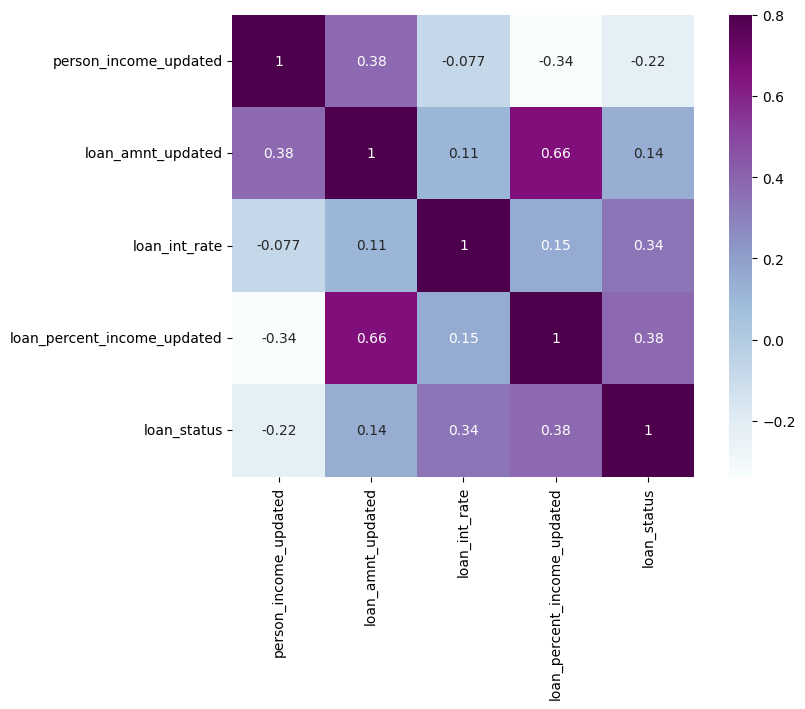

In [58]:
matrix = df_lap_train_final[numericals+label].corr()
f, ax = plt.subplots(figsize=(9,6))
sns.heatmap(matrix,vmax=.8,square=True,cmap="BuPu", annot = True)

## Data Manipulation for Test Dataset

In [59]:
# Person Age
df_lap_test.loc[df_lap_test['person_age']<=30, 'person_age_group'] = 'Below_30'
df_lap_test.loc[df_lap_test['person_age'].between(31,40), 'person_age_group'] = '31_40'
df_lap_test.loc[df_lap_test['person_age'].between(41,50), 'person_age_group'] = '41_50'
df_lap_test.loc[df_lap_test['person_age'].between(51,60), 'person_age_group'] = '51_60'
df_lap_test.loc[df_lap_test['person_age']>=61, 'person_age_group'] = 'Above_60'

In [60]:
# Person Employment length 
df_lap_test.loc[df_lap_test['person_emp_length']==0, 'person_emp_length_group'] = 'Not_Employed'
df_lap_test.loc[df_lap_test['person_emp_length'].between(1,5), 'person_emp_length_group'] = '1_5'
df_lap_test.loc[df_lap_test['person_emp_length'].between(6,10), 'person_emp_length_group'] = '6_10'
df_lap_test.loc[df_lap_test['person_emp_length'].between(11,15), 'person_emp_length_group'] = '11_15'
df_lap_test.loc[df_lap_test['person_emp_length'].between(16,20), 'person_emp_length_group'] = '16_20'
df_lap_test.loc[df_lap_test['person_emp_length']>20, 'person_emp_length_group'] = 'Above_20'

In [61]:
# CB Person Cred History Length
df_lap_test.loc[df_lap_test['cb_person_cred_hist_length']==0, 'cb_person_cred_hist_length_group'] = 'No_History'
df_lap_test.loc[df_lap_test['cb_person_cred_hist_length'].between(1,5), 'cb_person_cred_hist_length_group'] = '1_5'
df_lap_test.loc[df_lap_test['cb_person_cred_hist_length'].between(6,10), 'cb_person_cred_hist_length_group'] = '6_10'
df_lap_test.loc[df_lap_test['cb_person_cred_hist_length'].between(11,15), 'cb_person_cred_hist_length_group'] = '11_15'
df_lap_test.loc[df_lap_test['cb_person_cred_hist_length'].between(16,20), 'cb_person_cred_hist_length_group'] = '16_20'
df_lap_test.loc[df_lap_test['cb_person_cred_hist_length']>20, 'cb_person_cred_hist_length_group'] = 'Above_20'

In [62]:
# Person Income
data=df_lap_test['person_income'].to_list()
## Calculate quartiles as outlined in the plotly documentation

def get_percentile(data, p):
    data.sort()
    n = len(data)
    x = n*p + 0.5

    #  If integer, return
    if x.is_integer():
        return round(data[int(x-1)], 2) # account for zero-indexing

    #  If not an integer, get the interpolated value of the values of floor and ceiling indices
    x1, x2 = math.floor(x), math.ceil(x)
    y1, y2 = data[x1-1], data[x2-1] # account for zero-indexing
    return round(np.interp(x=x, xp=[x1, x2], fp=[y1, y2]), 2)

## calculate all boxplot statistics
q1, median, q3 = get_percentile(data, 0.25), get_percentile(data, 0.50), get_percentile(data, 0.75)
iqr = q3 - q1
# Lower fence value is the minimum of y values that is more than the calculated lower limit
lower_limit = q1 - 1.5 * iqr
lower_fence = round(min([i for i in data if i >= lower_limit]), 2)
# Upper fence value is the maximum of y values that is less than the calculated upper limit
upper_limit = q3 + 1.5 * iqr
upper_fence = round(max([i for i in data if i <= upper_limit]), 2)
print('Upper Fence:',upper_fence,',Lower Fence:', lower_fence)
df_lap_test['person_income_updated']=df_lap_test.apply(lambda row: upper_fence if row['person_income'] > upper_fence else row['person_income'], axis=1)

Upper Fence: 126696 ,Lower Fence: 4000


In [63]:
# Loan Amount
data=df_lap_test['loan_amnt'].to_list()
## Calculate quartiles as outlined in the plotly documentation

def get_percentile(data, p):
    data.sort()
    n = len(data)
    x = n*p + 0.5

    #  If integer, return
    if x.is_integer():
        return round(data[int(x-1)], 2) # account for zero-indexing

    #  If not an integer, get the interpolated value of the values of floor and ceiling indices
    x1, x2 = math.floor(x), math.ceil(x)
    y1, y2 = data[x1-1], data[x2-1] # account for zero-indexing
    return round(np.interp(x=x, xp=[x1, x2], fp=[y1, y2]), 2)

## calculate all boxplot statistics
q1, median, q3 = get_percentile(data, 0.25), get_percentile(data, 0.50), get_percentile(data, 0.75)
iqr = q3 - q1
# Lower fence value is the minimum of y values that is more than the calculated lower limit
lower_limit = q1 - 1.5 * iqr
lower_fence = round(min([i for i in data if i >= lower_limit]), 2)
# Upper fence value is the maximum of y values that is less than the calculated upper limit
upper_limit = q3 + 1.5 * iqr
upper_fence = round(max([i for i in data if i <= upper_limit]), 2)
print('Upper Fence:',upper_fence,',Lower Fence:', lower_fence)
df_lap_test['loan_amnt_updated']=df_lap_test.apply(lambda row: upper_fence if row['loan_amnt'] > upper_fence else row['loan_amnt'], axis=1)

Upper Fence: 22500 ,Lower Fence: 700


In [64]:
# Loan Percent Income
df_lap_test['loan_percent_income_updated'] = df_lap_test['loan_amnt_updated'].astype(float)/df_lap_test['person_income_updated'].astype(float)
df_lap_test['loan_percent_income_updated']=df_lap_test.apply(lambda row: 0.8 if row['loan_percent_income_updated'] > 0.8 else row['loan_percent_income_updated'], axis=1)


In [65]:
columns = numericals

for index, col in enumerate(columns):
        df_lap_test[col] = df_lap_test[col].astype(float)
df_lap_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39098 entries, 0 to 39097
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                39098 non-null  int64  
 1   person_age                        39098 non-null  int64  
 2   person_income                     39098 non-null  int64  
 3   person_home_ownership             39098 non-null  object 
 4   person_emp_length                 39098 non-null  float64
 5   loan_intent                       39098 non-null  object 
 6   loan_grade                        39098 non-null  object 
 7   loan_amnt                         39098 non-null  int64  
 8   loan_int_rate                     39098 non-null  float64
 9   loan_percent_income               39098 non-null  float64
 10  cb_person_default_on_file         39098 non-null  object 
 11  cb_person_cred_hist_length        39098 non-null  int64  
 12  pers

In [66]:
df_lap_test_final=df_lap_test[ids+numericals+categoricals]

In [67]:
# Min Max Scaling 
for column in df_lap_test_final[numericals].columns: 
    df_lap_test_final[column] = (df_lap_test_final[column] - df_lap_test_final[column].min()) / (df_lap_test_final[column].max() - df_lap_test_final[column].min())     
df_lap_test_final.head(10)

/var/folders/1x/t9fnjfh55r3_7v4l61b7dhs00000gn/T/ipykernel_1589/1638474143.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,person_income_updated,loan_amnt_updated,loan_int_rate,loan_percent_income_updated,person_age_group,person_home_ownership,person_emp_length_group,loan_intent,loan_grade,cb_person_default_on_file,cb_person_cred_hist_length_group
0,58645,0.529765,1.000000,0.619533,0.401706,Below_30,RENT,1_5,HOMEIMPROVEMENT,F,N,1_5
1,58646,0.749821,0.426606,0.434991,0.121541,Below_30,MORTGAGE,6_10,PERSONAL,C,Y,1_5
2,58647,0.211906,0.151376,0.705213,0.158363,Below_30,RENT,1_5,VENTURE,E,Y,1_5
3,58648,0.374910,0.288991,0.208508,0.166779,31_40,RENT,1_5,DEBTCONSOLIDATION,A,N,6_10
4,58649,0.798722,0.655963,0.653086,0.175691,Below_30,MORTGAGE,6_10,HOMEIMPROVEMENT,D,Y,1_5
5,58650,0.505314,0.977064,0.519473,0.410854,Below_30,RENT,1_5,EDUCATION,D,N,1_5
6,58651,0.578666,0.334862,0.311564,0.124697,Below_30,OWN,6_10,PERSONAL,B,N,1_5
7,58652,0.415661,0.254587,0.080288,0.133496,Below_30,MORTGAGE,6_10,PERSONAL,A,N,1_5
8,58653,0.204766,0.298165,0.460755,0.302138,31_40,RENT,Not_Employed,PERSONAL,C,Y,6_10
9,58654,0.700919,0.426606,0.483523,0.130308,Below_30,RENT,1_5,DEBTCONSOLIDATION,C,Y,1_5


In [68]:
# One Hot Encoding
df_lap_test_final=pd.get_dummies(df_lap_test_final)

## Model Training

In [91]:
X = df_lap_train_final.drop('loan_status',axis=1)
y = df_lap_train_final.loan_status

In [92]:
from sklearn.model_selection import train_test_split
x_train, x_cv, y_train, y_cv = train_test_split(X,y, test_size=0.3)

In [93]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
model = LogisticRegression()
model.fit(x_train, y_train)

LogisticRegression()

In [94]:
pred_cv = model.predict(x_cv)
accuracy_score(y_cv,pred_cv)

0.9125838353984312

In [95]:
from sklearn.model_selection import StratifiedKFold

In [96]:
i=1
mean = 0
kf = StratifiedKFold(n_splits=5,random_state=1, shuffle=True)
for train_index,test_index in kf.split(X,y):
    print ('\n {} of kfold {} '.format(i,kf.n_splits))
    xtr,xvl = X.loc[train_index],X.loc[test_index]
    ytr,yvl = y[train_index],y[test_index]
    model = LogisticRegression(random_state=1)
    model.fit(xtr,ytr)
    pred_test=model.predict(xvl)
    score=accuracy_score(yvl,pred_test)
    mean += score
    print ('accuracy_score',score)
    i+=1
    pred_test = model.predict(df_lap_test_final.drop(ids, axis=1))
    pred = model.predict_proba(df_lap_test_final.drop(ids, axis=1))[:,1]
    
print ('\n Mean Validation Accuracy',mean/(i-1))


 1 of kfold 5 
accuracy_score 0.9132918407366357

 2 of kfold 5 
accuracy_score 0.9102225253644812

 3 of kfold 5 
accuracy_score 0.9144854633813624

 4 of kfold 5 
accuracy_score 0.9105635604058318

 5 of kfold 5 
accuracy_score 0.9092846790007674

 Mean Validation Accuracy 0.9115696137778156


## Submission

In [75]:
df_submission = df_lap_test_final[['id']]
df_submission['loan_status']=pred
df_submission.columns
df_submission.head(10)

/var/folders/1x/t9fnjfh55r3_7v4l61b7dhs00000gn/T/ipykernel_1589/2193415226.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,loan_status
0,58645,0.910906
1,58646,0.010289
2,58647,0.619758
3,58648,0.086854
4,58649,0.403450
5,58650,0.868908
6,58651,0.000583
7,58652,0.008180
8,58653,0.385545
9,58654,0.078536


In [76]:
df_submission[['id','loan_status']].to_csv('s4e10_lpa_logistic.csv',index=False)

### Decision Tree

In [77]:
from sklearn.ensemble import RandomForestClassifier
i=1
mean = 0
kf = StratifiedKFold(n_splits=5,random_state=1,shuffle=True)
for train_index,test_index in kf.split(X,y):
    print ('\n{} of kfold {} '.format(i,kf.n_splits))
    xtr,xvl = X.loc[train_index],X.loc[test_index]
    ytr,yvl = y[train_index],y[test_index]
    model = RandomForestClassifier(random_state=1, max_depth=10)
    model.fit(xtr,ytr)
    pred_test=model.predict(xvl)
    score=accuracy_score(yvl,pred_test)
    mean += score
    print ('accuracy_score',score)
    i+=1
    pred_test = model.predict(df_lap_test_final.drop(ids, axis=1))
    pred = model.predict_proba(df_lap_test_final.drop(ids, axis=1))[:,1]
print ('\n Mean Validation Accuracy',mean/(i-1))


1 of kfold 5 
accuracy_score 0.9431324068548044

2 of kfold 5 
accuracy_score 0.9407451615653508

3 of kfold 5 
accuracy_score 0.9438997356978429

4 of kfold 5 
accuracy_score 0.9402336090033251

5 of kfold 5 
accuracy_score 0.9377611049535339

 Mean Validation Accuracy 0.9411544036149714


In [80]:
i=1
mean = 0
kf = StratifiedKFold(n_splits=5,random_state=1,shuffle=True)
for train_index,test_index in kf.split(X,y):
    print ('\n{} of kfold {} '.format(i,kf.n_splits))
    xtr,xvl = X.loc[train_index],X.loc[test_index]
    ytr,yvl = y[train_index],y[test_index]
    model = RandomForestClassifier(random_state=1, max_depth=17,n_estimators=141)
    model.fit(xtr,ytr)
    pred_test=model.predict(xvl)
    score=accuracy_score(yvl,pred_test)
    mean += score
    print ('accuracy_score',score)
    i+=1
    pred_test = model.predict(df_lap_test_final.drop(ids, axis=1))
    pred = model.predict_proba(df_lap_test_final.drop(ids, axis=1))[:,1]
print ('\n Mean Validation Accuracy',mean/(i-1))


1 of kfold 5 
accuracy_score 0.9454343933839202

2 of kfold 5 
accuracy_score 0.9449228408218945

3 of kfold 5 
accuracy_score 0.9469690510699974

4 of kfold 5 
accuracy_score 0.9423650780117657

5 of kfold 5 
accuracy_score 0.9398925739619746

 Mean Validation Accuracy 0.9439167874499104


In [81]:
df_submission = df_lap_test_final[['id']]
df_submission['loan_status']=pred
df_submission.columns
df_submission.head(10)

/var/folders/1x/t9fnjfh55r3_7v4l61b7dhs00000gn/T/ipykernel_1589/2193415226.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,loan_status
0,58645,0.941051
1,58646,0.032339
2,58647,0.873164
3,58648,0.033746
4,58649,0.249351
5,58650,0.922167
6,58651,0.006951
7,58652,0.005537
8,58653,0.227147
9,58654,0.066753


In [82]:
df_submission[['id','loan_status']].to_csv('s4e10_lpa_rf.csv',index=False)

<Axes: >

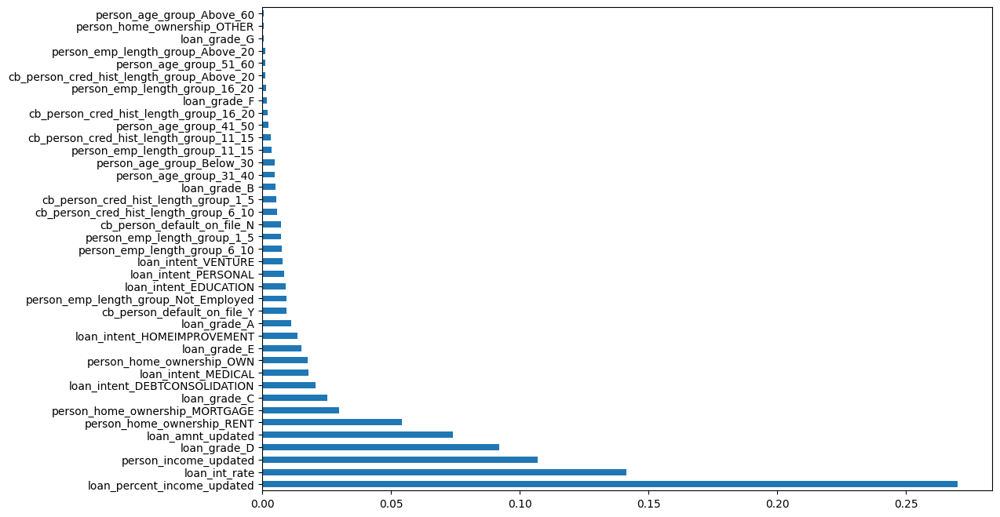

In [83]:
importances=pd.Series(model.feature_importances_, index=X.columns).sort_values(axis=0, ascending=False)
importances.plot(kind='barh', figsize=(12,8))

#### XG Boost

In [84]:
from xgboost import XGBClassifier
i=1
mean = 0
kf = StratifiedKFold(n_splits=5,random_state=1,shuffle=True)
for train_index,test_index in kf.split(X,y):
    print ('\n{} of kfold {} '.format(i,kf.n_splits))
    xtr,xvl = X.loc[train_index],X.loc[test_index]
    ytr,yvl = y[train_index],y[test_index]
    model = XGBClassifier(n_estimators=50, max_depth=4)
    model.fit(xtr,ytr)
    pred_test=model.predict(xvl)
    score=accuracy_score(yvl,pred_test)
    mean += score
    print ('accuracy_score',score)
    i+=1
    pred_test = model.predict(df_lap_test_final.drop(ids, axis=1))
    pred = model.predict_proba(df_lap_test_final.drop(ids, axis=1))[:,1]
print ('\n Mean Validation Accuracy',mean/(i-1))


1 of kfold 5 
accuracy_score 0.9472248273510103

2 of kfold 5 
accuracy_score 0.9472248273510103

3 of kfold 5 
accuracy_score 0.9485889675164123

4 of kfold 5 
accuracy_score 0.9452638758632449

5 of kfold 5 
accuracy_score 0.9434734418961548

 Mean Validation Accuracy 0.9463551879955666


In [85]:
df_submission = df_lap_test_final[['id']]
df_submission['loan_status']=pred
df_submission.columns
df_submission.head(10)

/var/folders/1x/t9fnjfh55r3_7v4l61b7dhs00000gn/T/ipykernel_1589/2193415226.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,loan_status
0,58645,0.954899
1,58646,0.029291
2,58647,0.774216
3,58648,0.088623
4,58649,0.078691
5,58650,0.828751
6,58651,0.002716
7,58652,0.019644
8,58653,0.388994
9,58654,0.070058


In [86]:
df_submission[['id','loan_status']].to_csv('s4e10_lpa_xgb.csv',index=False)

In [90]:
import joblib

# Assuming `model` is your trained model
joblib.dump(model, "trained_model.pkl")
print("Model saved as trained_model.pkl")


Model saved as trained_model.pkl
